Import the libraries for use

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

Mount the drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Read the data set in to df "ldf"

In [ ]:
ldf = pd.read_csv(r'/content/drive/My Drive/Colab/dataset/loan.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (47) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
# Read the top 5 rows of the dataset
ldf.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [ ]:
# read the bottom 4 rows of the dataset
ldf.tail()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39716,87023,86999,7500,7500,800.0,36 months,13.75%,255.43,E,E2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# copy the orginal dataset into a temporary variable for future reference
org_ldf = ldf[:]

In [ ]:
# get the rows vs cols of the dataset
ldf.shape

(39717, 111)

In [ ]:
# fetch non null, dtype of the dataset
ldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


In [ ]:
ldf.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)

Remove the columns which aren't necessary (i.e., they have no valid values)

In [ ]:
ldf.drop(ldf.iloc[:,53:105], inplace = True, axis=1)

In [ ]:
ldf.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,0.0,NaN,1,INDIVIDUAL,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,0.0,NaN,1,INDIVIDUAL,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,0.0,NaN,1,INDIVIDUAL,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,0.0,NaN,1,INDIVIDUAL,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,0.0,NaN,1,INDIVIDUAL,0.0,0.0,NaN,NaN,NaN,NaN


Drop columns which don't seem to contain any differentiating values

In [ ]:
cols_to_drop = ['id','member_id','url','initial_list_status','collections_12_mths_ex_med','application_type','mths_since_last_major_derog','tot_hi_cred_lim','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit']

In [ ]:
ldf.drop(labels = cols_to_drop, inplace = True, axis = 1)

In [ ]:
ldf.shape

(39717, 48)

In [ ]:
ldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 48 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                39717 non-null  int64  
 1   funded_amnt              39717 non-null  int64  
 2   funded_amnt_inv          39717 non-null  float64
 3   term                     39717 non-null  object 
 4   int_rate                 39717 non-null  object 
 5   installment              39717 non-null  float64
 6   grade                    39717 non-null  object 
 7   sub_grade                39717 non-null  object 
 8   emp_title                37258 non-null  object 
 9   emp_length               38642 non-null  object 
 10  home_ownership           39717 non-null  object 
 11  annual_inc               39717 non-null  float64
 12  verification_status      39717 non-null  object 
 13  issue_d                  39717 non-null  object 
 14  loan_status           

Remove the columns which have ver less non-null cells comparitive to others

In [ ]:
ldf.drop(labels = ['mths_since_last_delinq','mths_since_last_record','next_pymnt_d'], inplace = True, axis = 1)

In [ ]:
ldf.shape

(39717, 45)

In [ ]:
ldf.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,...,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,policy_code,pub_rec_bankruptcies,tax_liens
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,...,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,1,0.0,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,...,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,1,0.0,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,...,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,1,0.0,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,...,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,1,0.0,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,...,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,1,0.0,0.0


Perform column wise operation of data imputation and correction

In [ ]:
ldf.emp_length = ldf.emp_length.str.extract('(\d+)')
ldf.term = ldf.term.str.extract('(\d+)')
ldf.int_rate = ldf.int_rate.str.rstrip('%')

In [ ]:
ldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 45 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                39717 non-null  int64  
 1   funded_amnt              39717 non-null  int64  
 2   funded_amnt_inv          39717 non-null  float64
 3   term                     39717 non-null  object 
 4   int_rate                 39717 non-null  object 
 5   installment              39717 non-null  float64
 6   grade                    39717 non-null  object 
 7   sub_grade                39717 non-null  object 
 8   emp_title                37258 non-null  object 
 9   emp_length               38642 non-null  object 
 10  home_ownership           39717 non-null  object 
 11  annual_inc               39717 non-null  float64
 12  verification_status      39717 non-null  object 
 13  issue_d                  39717 non-null  object 
 14  loan_status           

In [ ]:
#look for possible columns that can be converted to numeric

ldf.dtypes[ldf.dtypes == 'object']

term                   object
int_rate               object
grade                  object
sub_grade              object
emp_title              object
emp_length             object
home_ownership         object
verification_status    object
issue_d                object
loan_status            object
pymnt_plan             object
desc                   object
purpose                object
title                  object
zip_code               object
addr_state             object
earliest_cr_line       object
revol_util             object
last_pymnt_d           object
last_credit_pull_d     object
dtype: object

In [ ]:
cols_to_numeric = ['term','int_rate', 'emp_length']
ldf[cols_to_numeric] = ldf[cols_to_numeric].apply(pd.to_numeric)

In [ ]:
ldf.dtypes[ldf.dtypes == 'object']

grade                  object
sub_grade              object
emp_title              object
home_ownership         object
verification_status    object
issue_d                object
loan_status            object
pymnt_plan             object
desc                   object
purpose                object
title                  object
zip_code               object
addr_state             object
earliest_cr_line       object
revol_util             object
last_pymnt_d           object
last_credit_pull_d     object
dtype: object

In [ ]:
ldf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 45 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                39717 non-null  int64  
 1   funded_amnt              39717 non-null  int64  
 2   funded_amnt_inv          39717 non-null  float64
 3   term                     39717 non-null  int64  
 4   int_rate                 39717 non-null  float64
 5   installment              39717 non-null  float64
 6   grade                    39717 non-null  object 
 7   sub_grade                39717 non-null  object 
 8   emp_title                37258 non-null  object 
 9   emp_length               38642 non-null  float64
 10  home_ownership           39717 non-null  object 
 11  annual_inc               39717 non-null  float64
 12  verification_status      39717 non-null  object 
 13  issue_d                  39717 non-null  object 
 14  loan_status           

Find empty columns

In [ ]:
ldf.isnull().sum()

loan_amnt                      0
funded_amnt                    0
funded_amnt_inv                0
term                           0
int_rate                       0
installment                    0
grade                          0
sub_grade                      0
emp_title                   2459
emp_length                  1075
home_ownership                 0
annual_inc                     0
verification_status            0
issue_d                        0
loan_status                    0
pymnt_plan                     0
desc                       12940
purpose                        0
title                         11
zip_code                       0
addr_state                     0
dti                            0
delinq_2yrs                    0
earliest_cr_line               0
inq_last_6mths                 0
open_acc                       0
pub_rec                        0
revol_bal                      0
revol_util                    50
total_acc                      0
out_prncp 

Find empty rows

In [ ]:
ldf.isnull().all(axis=1).sum()

0

In [ ]:
ldf.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 'policy_code',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

As per our observation and understanding drop some additional columns

In [ ]:
ldf.drop(labels = ['emp_title','desc', 'pymnt_plan'], inplace = True, axis = 1)

Fill with dummy values where the experiece is null (look for median values later)

In [ ]:
ldf.emp_length.fillna(0, inplace = True)

In [ ]:
ldf.isnull().sum()

loan_amnt                    0
funded_amnt                  0
funded_amnt_inv              0
term                         0
int_rate                     0
installment                  0
grade                        0
sub_grade                    0
emp_length                   0
home_ownership               0
annual_inc                   0
verification_status          0
issue_d                      0
loan_status                  0
purpose                      0
title                       11
zip_code                     0
addr_state                   0
dti                          0
delinq_2yrs                  0
earliest_cr_line             0
inq_last_6mths               0
open_acc                     0
pub_rec                      0
revol_bal                    0
revol_util                  50
total_acc                    0
out_prncp                    0
out_prncp_inv                0
total_pymnt                  0
total_pymnt_inv              0
total_rec_prncp              0
total_re

In [ ]:
ldf.shape

(39717, 42)

Determine how consumer attributes and loan attributes influence the tendency of default

So, our goal is to understand if a loan is accepted based on the given data of loan status

1.   Fully paid
2.   Current
3.   Charged-off

In [ ]:
(ldf.loan_status.value_counts()*100)/len(ldf)

Fully Paid     82.961956
Charged Off    14.167737
Current         2.870307
Name: loan_status, dtype: float64

Start Performing Univariate Analysis on Top 10 columns that can influence the dataset

In [ ]:
ldf.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 'policy_code',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

In [ ]:
ldf.dtypes[~(ldf.dtypes == 'object')]

loan_amnt                    int64
funded_amnt                  int64
funded_amnt_inv            float64
term                         int64
int_rate                   float64
installment                float64
emp_length                 float64
annual_inc                 float64
dti                        float64
delinq_2yrs                  int64
inq_last_6mths               int64
open_acc                     int64
pub_rec                      int64
revol_bal                    int64
total_acc                    int64
out_prncp                  float64
out_prncp_inv              float64
total_pymnt                float64
total_pymnt_inv            float64
total_rec_prncp            float64
total_rec_int              float64
total_rec_late_fee         float64
recoveries                 float64
collection_recovery_fee    float64
last_pymnt_amnt            float64
policy_code                  int64
pub_rec_bankruptcies       float64
tax_liens                  float64
dtype: object

Remove further more columns which doesn't influence the dataset prediction

In [ ]:
ldf.drop(labels = ['policy_code', 'tax_liens'], inplace =  True, axis = 1)

loan_amnt, annual_inc, emp_length, installment, total_acc, pub_rec_bankruptcies

purpose, home_ownership,

* loan_amnt

In [ ]:
ldf.loan_amnt.describe()

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [ ]:
px.box(data_frame = ldf, x = 'loan_amnt' )

* annual_inc





In [ ]:
ldf.annual_inc.describe()

count    3.971700e+04
mean     6.896893e+04
std      6.379377e+04
min      4.000000e+03
25%      4.040400e+04
50%      5.900000e+04
75%      8.230000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

In [ ]:
px.box(data_frame=ldf, x = 'annual_inc')

> Removing outlier



In [ ]:
ldf = ldf[ldf.annual_inc <= ldf.annual_inc.quantile(q=0.95)]

In [ ]:
px.box(data_frame=ldf, x = 'annual_inc')

* emp_length

In [ ]:
px.box(data_frame = ldf, x = 'emp_length')

*  installment

In [ ]:
px.box(data_frame = ldf, x =  'installment')

In [ ]:
ldf = ldf[ldf.installment < ldf.installment.quantile(0.95)]

In [ ]:
px.box(data_frame = ldf, x =  'installment')

* total_acc

In [ ]:
ldf.total_acc.describe()

count    35854.000000
mean        21.397640
std         11.128954
min          2.000000
25%         13.000000
50%         20.000000
75%         28.000000
max         90.000000
Name: total_acc, dtype: float64

In [ ]:
px.box(data_frame = ldf, x= 'total_acc')

In [ ]:
ldf.pub_rec_bankruptcies.describe()

count    35235.000000
mean         0.045381
std          0.208958
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: pub_rec_bankruptcies, dtype: float64

In [ ]:
px.box(data_frame = ldf, x = 'pub_rec_bankruptcies')

In [ ]:
ldf[ldf.pub_rec_bankruptcies > 0.5].loan_status

66       Charged Off
70        Fully Paid
77        Fully Paid
161       Fully Paid
271       Fully Paid
            ...     
39562     Fully Paid
39573     Fully Paid
39623    Charged Off
39666    Charged Off
39680     Fully Paid
Name: loan_status, Length: 1593, dtype: object

Lets filter the dataset furthermore and determine the correlation between the consumer variables.

In [ ]:
ldf.funded_amnt.describe()

count    35854.000000
mean      9696.866458
std       5731.257273
min        500.000000
25%       5000.000000
50%       8725.000000
75%      13200.000000
max      32000.000000
Name: funded_amnt, dtype: float64

In [ ]:
px.box(data_frame=ldf, x = 'funded_amnt')

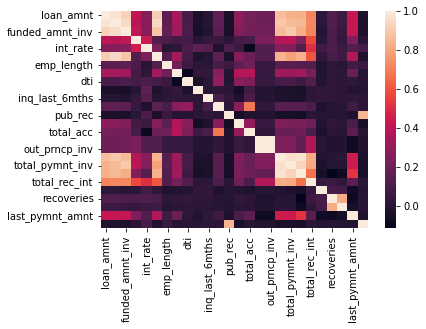

<Figure size 1152x432 with 0 Axes>

In [ ]:
ldf_correlation = ldf.corr()
sns.heatmap(ldf_correlation)
plt.figure(figsize=(16, 6))
plt.show()

In [ ]:
ldf.head(10)

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,5000,5000,4975.0,36,10.65,162.87,B,B2,10.0,RENT,...,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0
1,2500,2500,2500.0,60,15.27,59.83,C,C4,1.0,RENT,...,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0
2,2400,2400,2400.0,36,15.96,84.33,C,C5,10.0,RENT,...,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0
3,10000,10000,10000.0,36,13.49,339.31,C,C1,10.0,RENT,...,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0
4,3000,3000,3000.0,60,12.69,67.79,B,B5,1.0,RENT,...,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0
5,5000,5000,5000.0,36,7.90,156.46,A,A4,3.0,RENT,...,5632.21,5000.00,632.21,0.00,0.00,0.00,Jan-15,161.03,Jan-16,0.0
6,7000,7000,7000.0,60,15.96,170.08,C,C5,8.0,RENT,...,10110.84,6985.61,3125.23,0.00,0.00,0.00,May-16,1313.76,May-16,0.0
7,3000,3000,3000.0,36,18.64,109.43,E,E1,9.0,RENT,...,3939.14,3000.00,939.14,0.00,0.00,0.00,Jan-15,111.34,Dec-14,0.0
8,5600,5600,5600.0,60,21.28,152.39,F,F2,4.0,OWN,...,646.02,162.02,294.94,0.00,189.06,2.09,Apr-12,152.39,Aug-12,0.0
9,5375,5375,5350.0,60,12.69,121.45,B,B5,1.0,RENT,...,1469.34,673.48,533.42,0.00,269.29,2.52,Nov-12,121.45,Mar-13,0.0


In [ ]:
ldf.isna().sum()

loan_amnt                    0
funded_amnt                  0
funded_amnt_inv              0
term                         0
int_rate                     0
installment                  0
grade                        0
sub_grade                    0
emp_length                   0
home_ownership               0
annual_inc                   0
verification_status          0
issue_d                      0
loan_status                  0
purpose                      0
title                       11
zip_code                     0
addr_state                   0
dti                          0
delinq_2yrs                  0
earliest_cr_line             0
inq_last_6mths               0
open_acc                     0
pub_rec                      0
revol_bal                    0
revol_util                  48
total_acc                    0
out_prncp                    0
out_prncp_inv                0
total_pymnt                  0
total_pymnt_inv              0
total_rec_prncp              0
total_re

Pick top four important columns for binning and analysis

* loan_amnt
* annual_inc
* int_rate
* dti

In [ ]:
# Loan Amount

ldf.loan_amnt.describe()

count    35854.000000
mean      9961.560774
std       6085.789711
min        500.000000
25%       5000.000000
50%       9000.000000
75%      14000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [ ]:
fig_la = px.histogram(ldf, x='loan_amnt', marginal = 'rug')
fig_la.show()

In [ ]:
ldf['loan_amount_category'] = pd.cut(ldf.loan_amnt, [0, 7000, 14000, 21000, 28000, 35000], labels = ['0-7k', '7k-14k', '14k-21k', '21k-28k', '28k-35k'])

In [ ]:
# Annual Increase

ldf.annual_inc.describe()

count     35854.000000
mean      59555.205071
std       27147.724174
min        4000.000000
25%       39996.000000
50%       55000.000000
75%       75000.000000
max      142000.000000
Name: annual_inc, dtype: float64

In [ ]:
fig_ai = px.histogram(ldf, x='annual_inc', marginal = 'rug')
fig_ai.show()

In [ ]:
ldf['Annual_inc_category'] = pd.cut(ldf.annual_inc, [0, 20000, 40000, 60000, 80000, 100000], labels= ['0-20k', '20k-40k', '40k-60k', '60k-80k', '80k+'])

In [ ]:
# interst rates

ldf.int_rate.describe()

count    35854.000000
mean        11.836551
std          3.635540
min          5.420000
25%          8.900000
50%         11.710000
75%         14.270000
max         24.400000
Name: int_rate, dtype: float64

In [ ]:
fig_ir = px.histogram(ldf, x='int_rate', marginal = 'rug')
fig_ir.show()

In [ ]:
ldf['Interest_rate_catergory'] = pd.cut(ldf.int_rate, [0, 10, 15, 20, 22 ], labels = ['<10', '10-15', '15-20', '>20'])

In [ ]:
# dti

ldf.dti.describe()

count    35854.000000
mean        13.450981
std          6.685159
min          0.000000
25%          8.330000
50%         13.560000
75%         18.750000
max         29.990000
Name: dti, dtype: float64

In [ ]:
fig_dti = px.histogram(ldf, x='dti', marginal = 'rug')
fig_dti.show()

In [ ]:
ldf['dti_category'] = pd.cut(ldf.dti, [0, 5, 10, 15, 20,25], labels = ['0-5', '5-10', '10-15', '15-20', '>25'])

In [ ]:
ldf.shape

(35854, 44)

In [ ]:
ldf.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies,loan_amount_category,Annual_inc_category,Interest_rate_catergory,dti_category
0,5000,5000,4975.0,36,10.65,162.87,B,B2,10.0,RENT,...,0.00,0.00,Jan-15,171.62,May-16,0.0,0-7k,20k-40k,10-15,NaN
1,2500,2500,2500.0,60,15.27,59.83,C,C4,1.0,RENT,...,117.08,1.11,Apr-13,119.66,Sep-13,0.0,0-7k,20k-40k,15-20,0-5
2,2400,2400,2400.0,36,15.96,84.33,C,C5,10.0,RENT,...,0.00,0.00,Jun-14,649.91,May-16,0.0,0-7k,0-20k,15-20,5-10
3,10000,10000,10000.0,36,13.49,339.31,C,C1,10.0,RENT,...,0.00,0.00,Jan-15,357.48,Apr-16,0.0,7k-14k,40k-60k,10-15,15-20
4,3000,3000,3000.0,60,12.69,67.79,B,B5,1.0,RENT,...,0.00,0.00,May-16,67.79,May-16,0.0,0-7k,60k-80k,10-15,15-20


Lets plot a graph to understand the status of loans among the total 

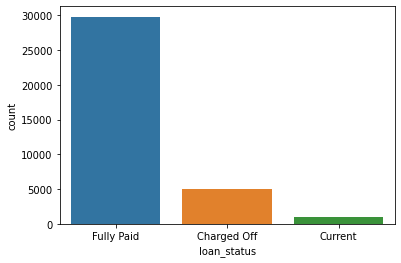

In [ ]:
sns.countplot(data = ldf, x='loan_status')

> Majority of the loans are fully paid from the dataset

Understand the purpose among total loans

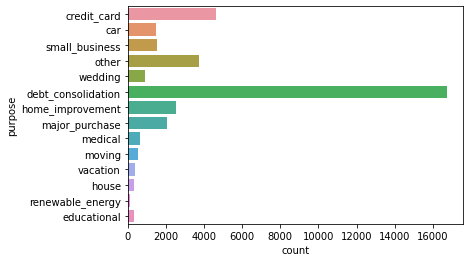

In [ ]:
sns.countplot(data = ldf, y = 'purpose')

> Majority of applicants are for debt consolidation, credit card, other and home improvement


Understand the purpose and status of the loan that was used for

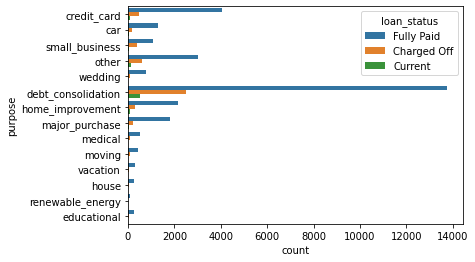

In [ ]:
sns.countplot(data = ldf, y = 'purpose', hue = 'loan_status')

> Loans considered for debt_consolidation are majorly having loans charged off  followed by Credit_card purpose

Lets try to understand the home ownership consumer variable among the loan applicants

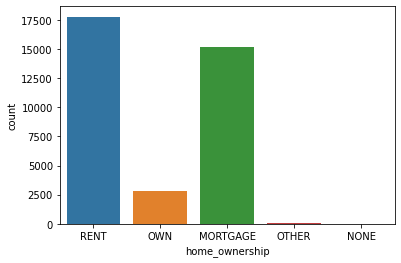

In [ ]:
sns.countplot(data = ldf, x = 'home_ownership')

> From the above plot, we can notice that the majority of the applicants are either on Rent or Mortgage

Understand the home ownership status and loan status

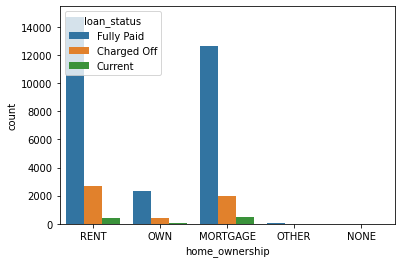

In [ ]:
sns.countplot(data = ldf, x = 'home_ownership', hue = 'loan_status')

> from the above plot we can understand that majority of the fully paid loans are with ownership status as Rent or Mortgage. Also, there seem to many charged off loans for the same.

Lets find the consumer variable term in the total applicantions

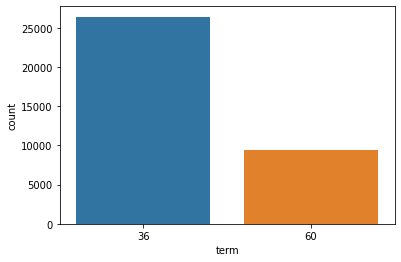

In [ ]:
sns.countplot(data = ldf, x = 'term')

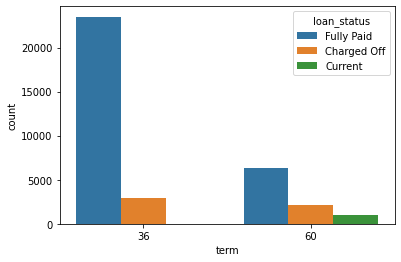

In [ ]:
sns.countplot(data = ldf, x = 'term', hue = 'loan_status')

> Above plot demonstrates that the loans with lower term seems to get full paid in larger proportion

To understand the data better, lets try analyzing two consumer variables at a time. 

Our target prediction is for a successful loan (i.e., loan_status). So, lets plot some graphs for binned consumer variables against the loan status

In [ ]:
ldf.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'purpose', 'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies', 'loan_amount_category', 'Annual_inc_category',
       'Interest_rate_catergory', 'dti_category'],
      dtype='object')

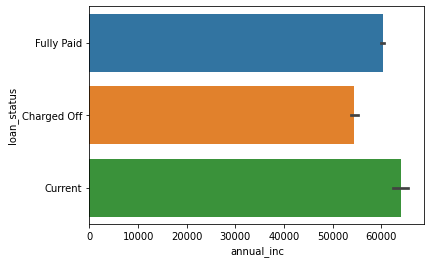

In [ ]:
sns.barplot(data = ldf, x='annual_inc', y = 'loan_status')

Bi-variate numerical - numerical analysis

In [ ]:
numerical_var = ldf.select_dtypes(include = ['int64', 'float64'])[:]

numerical_var.shape
numerical_var.dtypes

loan_amnt                    int64
funded_amnt                  int64
funded_amnt_inv            float64
term                         int64
int_rate                   float64
installment                float64
emp_length                 float64
annual_inc                 float64
dti                        float64
delinq_2yrs                  int64
inq_last_6mths               int64
open_acc                     int64
pub_rec                      int64
revol_bal                    int64
total_acc                    int64
out_prncp                  float64
out_prncp_inv              float64
total_pymnt                float64
total_pymnt_inv            float64
total_rec_prncp            float64
total_rec_int              float64
total_rec_late_fee         float64
recoveries                 float64
collection_recovery_fee    float64
last_pymnt_amnt            float64
pub_rec_bankruptcies       float64
dtype: object

Correlation matrix

In [ ]:
ncorrelation = numerical_var.dropna().corr()

ncorrelation

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,...,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
loan_amnt,1.000000,0.973855,0.943585,0.410527,0.256430,0.910885,0.152014,0.345313,0.097674,-0.038944,...,0.196915,0.867579,0.843468,0.829467,0.713360,0.015628,0.120589,0.059822,0.423231,-0.024550
funded_amnt,0.973855,1.000000,0.971088,0.393834,0.263129,0.946263,0.152551,0.339166,0.098797,-0.039679,...,0.200339,0.891344,0.868343,0.855074,0.725534,0.016646,0.122220,0.062166,0.430497,-0.025935
funded_amnt_inv,0.943585,0.971088,1.000000,0.408781,0.256970,0.908047,0.158089,0.327932,0.101518,-0.042029,...,0.207801,0.876803,0.898944,0.837979,0.723604,0.003146,0.114829,0.053376,0.421860,-0.029506
term,0.410527,0.393834,0.408781,1.000000,0.444309,0.127689,0.109159,0.083415,0.083327,0.003985,...,0.228563,0.376069,0.388620,0.255712,0.575553,0.014714,0.106781,0.036365,0.239183,0.014159
int_rate,0.256430,0.263129,0.256970,0.444309,1.000000,0.231784,-0.000103,0.021051,0.103111,0.156459,...,0.122403,0.258982,0.254324,0.129813,0.510591,0.084476,0.114599,0.057501,0.121905,0.089688
installment,0.910885,0.946263,0.908047,0.127689,0.231784,1.000000,0.122876,0.338345,0.086154,-0.026089,...,0.125148,0.835985,0.805439,0.831025,0.605293,0.022251,0.101833,0.059968,0.375548,-0.020909
emp_length,0.152014,0.152551,0.158089,0.109159,-0.000103,0.122876,1.000000,0.210287,0.057209,0.013135,...,0.048069,0.135731,0.141607,0.127003,0.119843,-0.015436,0.016019,0.000292,0.072550,0.050500
annual_inc,0.345313,0.339166,0.327932,0.083415,0.021051,0.338345,0.210287,1.000000,-0.082316,0.034289,...,0.047235,0.327109,0.317073,0.333094,0.220894,-0.013779,0.018747,0.005711,0.181885,-0.002651
dti,0.097674,0.098797,0.101518,0.083327,0.103111,0.086154,0.057209,-0.082316,1.000000,-0.030982,...,0.042886,0.092556,0.094818,0.068516,0.125985,-0.007442,0.028774,0.015262,0.019417,0.005520
delinq_2yrs,-0.038944,-0.039679,-0.042029,0.003985,0.156459,-0.026089,0.013135,0.034289,-0.030982,1.000000,...,-0.002906,-0.029396,-0.032054,-0.044994,0.016505,0.030477,0.014819,0.014374,-0.011848,0.003011


To many variables to draw an inference, maybe a heatmap gives us a better idea

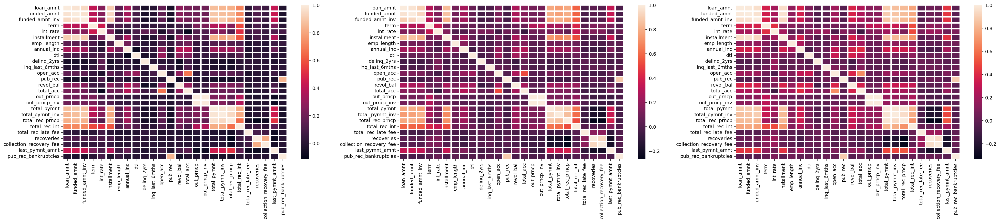

In [ ]:

plt.figure(figsize=(36,6), dpi = 140)

for j, i in enumerate(['pearson', 'kendall', 'spearman']):
  plt.subplot(1,3,j+1)  
  ncorrelation = numerical_var.dropna().corr(method = i)
  sns.heatmap(ncorrelation, linewidth = 2)

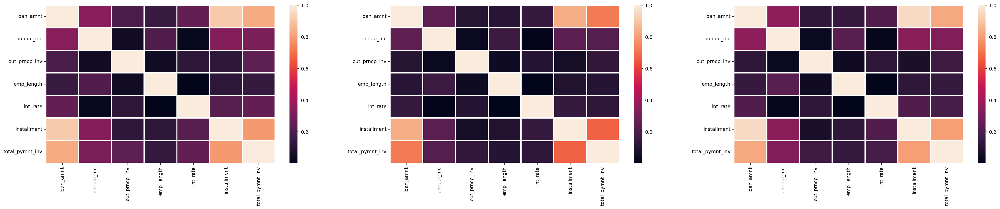

In [ ]:
plt.figure(figsize=(36,6), dpi = 140)

for j, i in enumerate(['pearson', 'kendall', 'spearman']):
  plt.subplot(1,3,j+1)
  ncorrelation = numerical_var[['loan_amnt','annual_inc', 'out_prncp_inv', 'emp_length', 'int_rate', 'installment', 'total_pymnt_inv'] ].dropna().corr(method=i)
  sns.heatmap(ncorrelation, linewidth = 2)


In [ ]:
numerical_var.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'emp_length', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'total_acc',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_amnt', 'pub_rec_bankruptcies'],
      dtype='object')

<Figure size 840x560 with 0 Axes>

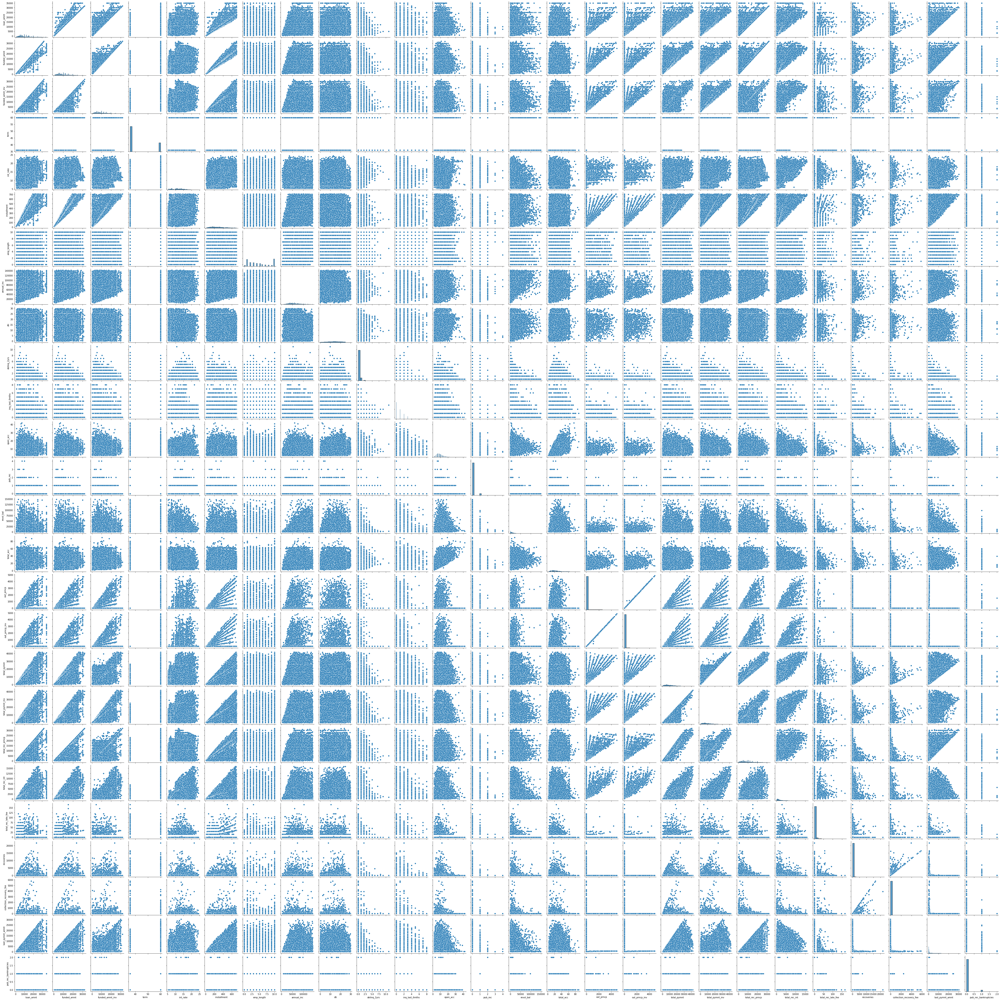

In [ ]:
plt.figure(dpi=140)
sns.pairplot(numerical_var)
plt.show()